In [127]:
import gc
import json 
from pathlib import Path
import torch
import torch.nn.functional as F
from FLUX_custom_pipeline import FluxPipeline
import argparse
import random
import numpy as np
import matplotlib.pyplot as plt



In [2]:
 # Load model
pipe = FluxPipeline.from_pretrained("black-forest-labs/FLUX.1-dev", torch_dtype=torch.float16)
pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [141]:
prompt = "A haunted attic filled with glowing artifacts. A dusty mirror has scrawled words: 'DON’T LOOK TWICE'. A book floats mid-air, its spine labeled 'Rituals of the Veil'. Faint writing glows on the floorboards."

In [142]:
slg_scales = np.arange(0, 2.2, 0.2) 
images = []
for scale in slg_scales: 
    pipe.skipped_layers = [5,7,9,11,12]
    image = pipe(
        prompt,
        negative_prompt=prompt,
        true_cfg_scale=scale,
        max_sequence_length=256,
        generator=torch.Generator("cpu").manual_seed(42)
    ).images[0]
    images.append(image)

Performing Skip-Layer Guidance with scale 0.0.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 0.2.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 0.4.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 0.6000000000000001.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 0.8.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 1.0.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 1.2000000000000002.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 1.4000000000000001.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 1.6.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 1.8.


  0%|          | 0/28 [00:00<?, ?it/s]

Performing Skip-Layer Guidance with scale 2.0.


  0%|          | 0/28 [00:00<?, ?it/s]

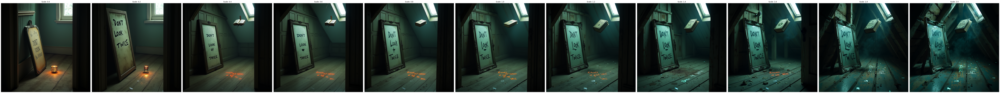

In [143]:
fig, axes = plt.subplots(1, len(images), figsize=(100, 20))
for idx, (img, scale) in enumerate(zip(images, slg_scales)):
    axes[idx].imshow(img)
    axes[idx].set_title(f'Scale: {scale:.1f}')
    axes[idx].axis('off')
plt.tight_layout()
plt.show()